### IRISデータセットの読み込み

In [2]:
from sklearn.datasets import load_iris
import pandas as pd
iris = load_iris()

In [3]:
iris.data.shape

(150, 4)

In [4]:
"""
★データセットはサンプルコードとほぼ同じ
0→Iris-setosa
1→Iris-versicolor
2→Iris-virginica

★Seriesは一次元のデータ構造、DataFrameは二次元のデータ構造
"""

iris_data = pd.DataFrame(data=iris.data, columns=iris.feature_names)
iris_label = pd.Series(data=iris.target)

print(iris_data.head())
print(iris_label.head(5))

   sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)
0                5.1               3.5                1.4               0.2
1                4.9               3.0                1.4               0.2
2                4.7               3.2                1.3               0.2
3                4.6               3.1                1.5               0.2
4                5.0               3.6                1.4               0.2
0    0
1    0
2    0
3    0
4    0
dtype: int32


In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

"""
★処理
indexはiris_dateでは3まで、iris_labelでは0まで
100行目のsetosa and versicolorのデータだけ取得する
「SepalLength」「PetalLength」のみ抽出

★valeusについて
valuesを付けるとnumpy.ndarray、付けないとpandas.core.series.Seriesになる
"""

X = iris_data.iloc[0:100, [0,2]].values 
y_tmp = iris_label.iloc[0:100,].values

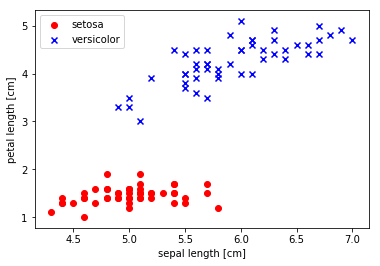

In [6]:
# plot data
plt.scatter(X[:50, 0], X[:50, 1],
            color='red', marker='o', label='setosa')
plt.scatter(X[50:100, 0], X[50:100, 1],
            color='blue', marker='x', label='versicolor')

plt.xlabel('sepal length [cm]')
plt.ylabel('petal length [cm]')
plt.legend(loc='upper left')

# plt.savefig('images/02_06.png', dpi=300)
plt.show()

In [7]:
import numpy as np


class Perceptron(object):
    """Perceptron classifier.

    Parameters
    ------------
    eta : float
      Learning rate (between 0.0 and 1.0)
    n_iter : int
      Passes over the training dataset.
    random_state : int
      Random number generator seed for random weight
      initialization.

    Attributes
    -----------
    w_ : 1d-array
      Weights after fitting.
    errors_ : list
      Number of misclassifications (updates) in each epoch.

    """
    def __init__(self, eta=0.01, n_iter=50, random_state=1):
        self.eta = eta
        self.n_iter = n_iter
        self.random_state = random_state

    def fit(self, X, y):
        """Fit training data.

        Parameters
        ----------
        X : {array-like}, shape = [n_samples, n_features]
          Training vectors, where n_samples is the number of samples and
          n_features is the number of features.
        y : array-like, shape = [n_samples]
          Target values.

        Returns
        -------
        self : object

        """
        rgen = np.random.RandomState(self.random_state)
        self.w_ = rgen.normal(loc=0.0, scale=0.01, size=1 + X.shape[1])
        self.errors_ = []

        for _ in range(self.n_iter):
            errors = 0
            for xi, target in zip(X, y):
                update = self.eta * (target - self.predict(xi))
                self.w_[1:] += update * xi
                self.w_[0] += update
                errors += int(update != 0.0)
            self.errors_.append(errors)
        return self

    def net_input(self, X):
        """Calculate net input"""
        return np.dot(X, self.w_[1:]) + self.w_[0]

    def predict(self, X):
        """Return class label after unit step"""
        return np.where(self.net_input(X) >= 0.0, 1, -1)

### モデル作成

In [8]:
y_tmp

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [9]:
y = np.where(y_tmp == 0, -1 , 1)

In [32]:
y

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1])

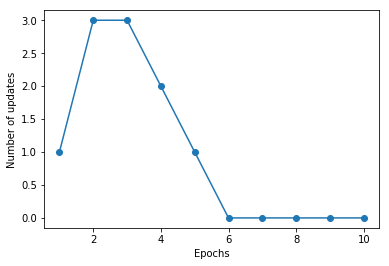

In [11]:
"""
Perceptronのインスタンス作成
エポック：10回
学習率：0.1
"""
ppn = Perceptron(eta=0.1, n_iter=10)

"""
モデルに説明変数と目的変数をFIT
"""
ppn.fit(X, y)

"""
グラフを描写
"""
plt.plot(range(1, len(ppn.errors_) + 1), ppn.errors_, marker='o')
plt.xlabel('Epochs')
plt.ylabel('Number of updates')
plt.show()

### 識別結果をプロット

In [26]:
from matplotlib.colors import ListedColormap

def plot_decision_regions(X, y, classifier, resolution=0.02):

    # setup marker generator and color map
    markers = ('s', 'x', 'o', '^', 'v')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    # 目的変数のユニーク値分だけ、colorsから色を取得する
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # x1軸の最小値、最大値を設定する
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution), # resolutionはminとmaxの間の間隔を取得
                           np.arange(x2_min, x2_max, resolution))
    
    # classifierにPerceptionクラスを引き渡す
    # Perceptionクラスのpredictメソッドを実行する
    
    #予測するためのデータをインプット
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    
    # shapeでxx1の行数・列数を取得
    Z = Z.reshape(xx1.shape)
    # 塗りつぶした等高線を描写(alpha：透明度 cmap：色)
    plt.contourf(xx1, xx2, Z, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    # plot class samples
    # enumerate：index value
    # yのユニーク値分、color配列から色を取得
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], 
                    y=X[y == cl, 1],
                    alpha=0.8,           #透明度
                    c=colors[idx],       #色
                    marker=markers[idx], #マーカーの形
                    label=cl,            #凡例
                    edgecolor='black')   # グラフの枠線

In [21]:
# ravel()：複数次元を1次元にする
# [[xx1.ravel()][xx2.ravel()]]を転置して組み合わせを作る
np.array([xx1.ravel(), xx2.ravel()]).T

array([[0.  , 0.  ],
       [0.02, 0.  ],
       [0.04, 0.  ],
       [0.06, 0.  ],
       [0.08, 0.  ],
       [0.1 , 0.  ],
       [0.12, 0.  ],
       [0.14, 0.  ],
       [0.16, 0.  ],
       [0.18, 0.  ],
       [0.2 , 0.  ],
       [0.22, 0.  ],
       [0.24, 0.  ],
       [0.26, 0.  ],
       [0.28, 0.  ],
       [0.3 , 0.  ],
       [0.32, 0.  ],
       [0.34, 0.  ],
       [0.36, 0.  ],
       [0.38, 0.  ],
       [0.4 , 0.  ],
       [0.42, 0.  ],
       [0.44, 0.  ],
       [0.46, 0.  ],
       [0.48, 0.  ],
       [0.5 , 0.  ],
       [0.52, 0.  ],
       [0.54, 0.  ],
       [0.56, 0.  ],
       [0.58, 0.  ],
       [0.6 , 0.  ],
       [0.62, 0.  ],
       [0.64, 0.  ],
       [0.66, 0.  ],
       [0.68, 0.  ],
       [0.7 , 0.  ],
       [0.72, 0.  ],
       [0.74, 0.  ],
       [0.76, 0.  ],
       [0.78, 0.  ],
       [0.8 , 0.  ],
       [0.82, 0.  ],
       [0.84, 0.  ],
       [0.86, 0.  ],
       [0.88, 0.  ],
       [0.9 , 0.  ],
       [0.92, 0.  ],
       [0.94,

In [32]:
# setup marker generator and color map
markers = ('s', 'x', 'o', '^', 'v')
colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
# 目的変数のユニーク値分だけ、colorsから色を取得する
cmap = ListedColormap(colors[:len(np.unique(y))])

cmap

In [33]:
# x1軸の最小値、最大値を設定する
x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
print(x1_min)
print(x1_max)
print(x2_min)
print(x2_max)

3.3
8.0
0.0
6.1


In [36]:
xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, 0.02),
                       np.arange(x2_min, x2_max, 0.02))
xx1

array([[3.3 , 3.32, 3.34, 3.36, 3.38, 3.4 , 3.42, 3.44, 3.46, 3.48, 3.5 ,
        3.52, 3.54, 3.56, 3.58, 3.6 , 3.62, 3.64, 3.66, 3.68, 3.7 , 3.72,
        3.74, 3.76, 3.78, 3.8 , 3.82, 3.84, 3.86, 3.88, 3.9 , 3.92, 3.94,
        3.96, 3.98, 4.  , 4.02, 4.04, 4.06, 4.08, 4.1 , 4.12, 4.14, 4.16,
        4.18, 4.2 , 4.22, 4.24, 4.26, 4.28, 4.3 , 4.32, 4.34, 4.36, 4.38,
        4.4 , 4.42, 4.44, 4.46, 4.48, 4.5 , 4.52, 4.54, 4.56, 4.58, 4.6 ,
        4.62, 4.64, 4.66, 4.68, 4.7 , 4.72, 4.74, 4.76, 4.78, 4.8 , 4.82,
        4.84, 4.86, 4.88, 4.9 , 4.92, 4.94, 4.96, 4.98, 5.  , 5.02, 5.04,
        5.06, 5.08, 5.1 , 5.12, 5.14, 5.16, 5.18, 5.2 , 5.22, 5.24, 5.26,
        5.28, 5.3 , 5.32, 5.34, 5.36, 5.38, 5.4 , 5.42, 5.44, 5.46, 5.48,
        5.5 , 5.52, 5.54, 5.56, 5.58, 5.6 , 5.62, 5.64, 5.66, 5.68, 5.7 ,
        5.72, 5.74, 5.76, 5.78, 5.8 , 5.82, 5.84, 5.86, 5.88, 5.9 , 5.92,
        5.94, 5.96, 5.98, 6.  , 6.02, 6.04, 6.06, 6.08, 6.1 , 6.12, 6.14,
        6.16, 6.18, 6.2 , 6.22, 6.24, 

In [39]:
np.array([xx1.ravel(), xx2.ravel()]).T

array([[3.3 , 0.  ],
       [3.32, 0.  ],
       [3.34, 0.  ],
       [3.36, 0.  ],
       [3.38, 0.  ],
       [3.4 , 0.  ],
       [3.42, 0.  ],
       [3.44, 0.  ],
       [3.46, 0.  ],
       [3.48, 0.  ],
       [3.5 , 0.  ],
       [3.52, 0.  ],
       [3.54, 0.  ],
       [3.56, 0.  ],
       [3.58, 0.  ],
       [3.6 , 0.  ],
       [3.62, 0.  ],
       [3.64, 0.  ],
       [3.66, 0.  ],
       [3.68, 0.  ],
       [3.7 , 0.  ],
       [3.72, 0.  ],
       [3.74, 0.  ],
       [3.76, 0.  ],
       [3.78, 0.  ],
       [3.8 , 0.  ],
       [3.82, 0.  ],
       [3.84, 0.  ],
       [3.86, 0.  ],
       [3.88, 0.  ],
       [3.9 , 0.  ],
       [3.92, 0.  ],
       [3.94, 0.  ],
       [3.96, 0.  ],
       [3.98, 0.  ],
       [4.  , 0.  ],
       [4.02, 0.  ],
       [4.04, 0.  ],
       [4.06, 0.  ],
       [4.08, 0.  ],
       [4.1 , 0.  ],
       [4.12, 0.  ],
       [4.14, 0.  ],
       [4.16, 0.  ],
       [4.18, 0.  ],
       [4.2 , 0.  ],
       [4.22, 0.  ],
       [4.24,

In [38]:
#予測するためのデータをインプット
#return np.where(self.net_input(X) >= 0.0, 1, -1)
Z = ppn.predict(np.array([xx1.ravel(), xx2.ravel()]).T)

# shapeでxx1の行数・列数を取得
Z = Z.reshape(xx1.shape)
Z

array([[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 

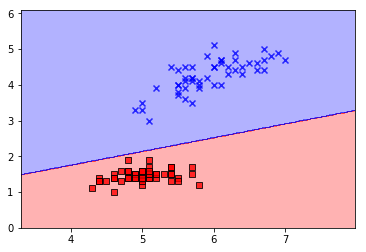

In [43]:
# 塗りつぶした等高線を描写(alpha：透明度 cmap：色)
plt.contourf(xx1, xx2, Z, alpha=0.3, cmap=cmap)
plt.xlim(xx1.min(), xx1.max())
plt.ylim(xx2.min(), xx2.max())


# plot class samples
# enumerate：index value
# yのユニーク値分、color配列から色を取得
for idx, cl in enumerate(np.unique(y)):
    plt.scatter(x=X[y == cl, 0], 
                y=X[y == cl, 1],
                alpha=0.8,           #透明度
                c=colors[idx],       #色
                marker=markers[idx], #マーカーの形
                label=cl,            #凡例
                edgecolor='black')   # グラフの枠線

もうちょっとPerceptionも詳しくみてみよう

In [27]:
class Perceptron(object):
    """Perceptron classifier.

    Parameters
    ------------
    eta : float
      Learning rate (between 0.0 and 1.0)
    n_iter : int
      Passes over the training dataset.
    random_state : int
      Random number generator seed for random weight
      initialization.

    Attributes
    -----------
    w_ : 1d-array
      Weights after fitting.
    errors_ : list
      Number of misclassifications (updates) in each epoch.

    """
    def __init__(self, eta=0.01, n_iter=50, random_state=1):
        self.eta = eta
        self.n_iter = n_iter
        self.random_state = random_state

    def fit(self, X, y):
        """Fit training data.

        Parameters
        ----------
        X : {array-like}, shape = [n_samples, n_features]
          Training vectors, where n_samples is the number of samples and
          n_features is the number of features.
        y : array-like, shape = [n_samples]
          Target values.

        Returns
        -------
        self : object

        """
        rgen = np.random.RandomState(self.random_state)
        self.w_ = rgen.normal(loc=0.0, scale=0.01, size=1 + X.shape[1])
        print("self.w_")
        print(self.w_)
        self.errors_ = []

        for _ in range(self.n_iter):
            errors = 0
            for xi, target in zip(X, y):
                update = self.eta * (target - self.predict(xi))
                self.w_[1:] += update * xi
                print("update")
                print(update)
                print("xi")
                print(xi)
                print("self.w_[1:]")
                print(self.w_[1:])
                self.w_[0] += update
                errors += int(update != 0.0)
            self.errors_.append(errors)
        return self

    def net_input(self, X):
        """Calculate net input"""
        return np.dot(X, self.w_[1:]) + self.w_[0]

    def predict(self, X):
        """Return class label after unit step"""
        return np.where(self.net_input(X) >= 0.0, 1, -1)

In [19]:
from sklearn.datasets import load_iris
import pandas as pd
import numpy as np
iris = load_iris()

iris_data = pd.DataFrame(data=iris.data, columns=iris.feature_names)
iris_label = pd.Series(data=iris.target)

X = iris_data.iloc[0:100, [0,2]].values 
y_tmp = iris_label.iloc[0:100,].values
y = np.where(y_tmp == 0, -1 , 1)

In [28]:
ppn = Perceptron(eta=0.1, n_iter=10)

"""
モデルに説明変数と目的変数をFIT
"""
ppn.fit(X, y)

self.w_
[ 0.01624345 -0.00611756 -0.00528172]
update
0.0
xi
[5.1 1.4]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.9 1.4]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.7 1.3]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.6 1.5]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[5.  1.4]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[5.4 1.7]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.6 1.4]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[5.  1.5]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.4 1.4]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.9 1.5]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[5.4 1.5]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.8 1.6]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.8 1.4]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[4.3 1.1]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[5.8 1.2]
self.w_[1:]
[-0.00611756 -0.00528172]
update
0.0
xi
[5.7 1.5]


0.0
xi
[4.8 1.4]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[4.3 1.1]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.8 1.2]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.7 1.5]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.4 1.3]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.1 1.4]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.7 1.7]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.1 1.5]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.4 1.7]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.1 1.5]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[4.6 1. ]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.1 1.7]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[4.8 1.9]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.  1.6]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.  1.6]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[5.2 1.5]
self.w_[1:]
[-1.20611756  0.75471828]
update
0.0
xi
[

[5.6 4.1]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.5 4. ]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.5 4.4]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[6.1 4.6]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.8 4. ]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.  3.3]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.6 4.2]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.7 4.2]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.7 4.2]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[6.2 4.3]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.1 3. ]
self.w_[1:]
[0.31388244 2.11471828]
update
0.0
xi
[5.7 4.1]
self.w_[1:]
[0.31388244 2.11471828]
update
-0.2
xi
[5.1 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.9 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.7 1.3]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.6 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.  1.4]
self.w_[1:]
[-0.70611

[-0.70611756  1.83471828]
update
0.0
xi
[4.6 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.  1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.4 1.7]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.6 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.  1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.4 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.9 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.4 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.8 1.6]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.8 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.3 1.1]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.8 1.2]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.7 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.4 1.3]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.1 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.7 1.7]
self.w_[1:]
[-0.7061

xi
[5.7 4.2]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.7 4.2]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[6.2 4.3]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.1 3. ]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.7 4.1]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.1 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.9 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.7 1.3]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.6 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.  1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.4 1.7]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.6 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.  1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.4 1.4]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.9 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[5.4 1.5]
self.w_[1:]
[-0.70611756  1.83471828]
update
0.0
xi
[4.8 